# Topic Modeling for Patent data

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
from IPython.core.display import HTML
css = open('style-table.css').read() + open('style-notebook.css').read()
HTML('<style>{}</style>'.format(css))

In [3]:
import nltk
import sys
import re, numpy as np, pandas as pd

In [4]:
# Visualization 
import matplotlib.pyplot as plt
import seaborn as sns
from pprint import pprint
%matplotlib inline
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [5]:
# Bokeh
from bokeh.io import output_notebook
from bokeh.plotting import figure, show
from bokeh.models import HoverTool, CustomJS, ColumnDataSource, Slider
from bokeh.layouts import column
from bokeh.palettes import all_palettes
output_notebook()

Loading BokehJS ...

In [6]:
# plotly
import plotly.graph_objs as go
import plotly.offline as py
from plotly.graph_objs import *
import plotly.figure_factory as ff

py.init_notebook_mode()

In [7]:
# Gensim
import gensim, spacy, logging, warnings
import gensim.corpora as corpora
from gensim.utils import lemmatize, simple_preprocess
from gensim.models import CoherenceModel

In [8]:
# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use', 'not', 'would', 'say', 'could', '_', 'be', 'know', 'good', 'go', 'get', 'do', 'done', 'try', 'many', 'some', 'nice', 'thank', 'think', 'see', 'rather', 'easy', 'easily', 'lot', 'lack', 'make', 'want', 'seem', 'run', 'need', 'even', 'right', 'line', 'even', 'also', 'may', 'take', 'come'])

In [9]:
# for clustering and networking
from scipy.spatial.distance import pdist, squareform
from gensim.matutils import jensen_shannon
import networkx as nx
import itertools as itt

In [10]:
import pickle
#Loading from firm cleaned file
patent_firm = pd.read_pickle('patent_firm_full_clean.pkl')
patent_firm.shape

(68764, 35)

In [11]:
patent_csv=pd.read_csv('patent_all_en_new.csv')
patent_csv.shape

(68764, 34)

In [12]:
patent = pd.read_pickle('eda.pkl')
patent.shape

(68762, 37)

- appln                     The identifier of the application (with letter at the end, seems Google omits that)
- appln_id                  The (internal) patstat identifier of the application
- family_id                 The (internal) patstat identifier of the family that the application is a member of sets  - sets                      Indicate which sets (fuel-cell = 1, electric  vehicle = 2, both = 3) was matched
- direct                    Indicate whether this application was found directly (title/abstract/cpc/ipc) or      indirectly (family association)
- granted                   Whether or not the application was granted
- earliest_appln            Per family, the earliest application
- earliest_filing_date      The date of the family's earliest application
- publn                     Identifiers of publications associated with this application (*)
- publn_date                The dates of associated publications (*)
- publn_first_grant         Indicates for each publication if its the first one with granted status
- num_cpc_class             The number of CPC classes for this application
- cpc_class                 The CPC class symbols for this application
- num_ipc_class             The number of IPC classes for this application
- ipc_class                 The IPC class symbols for this application
- num_cited_publn           The number of forward citations (this applications refers to other publications)
- cited_publn_date          The dates of cited publications (**)
- cited_publn               The identifiers of cited publications (**)
- cited_appln               The identifiers of the applications  associated with cited publications (**)
- cited_appln_id            The (internal) patstat identifiers of the  applications associated with cited publications (**)
- cited_family_id           The (internal) patstat identifiers of the  family associated with cited publications (**)
- num_cited_family          The total number of distinct families  associated with cited publications (***)
- num_citing_publn          The number of backward citations (other  publications refer to this application)
- citing_publn_date         The dates of citing publications (**)
- citing_publn              The identifiers of citing publications (**)
- citing_appln              The identifiers of the applications  associated with citing publications (**)
- citing_appln_id           The (internal) patstat identifiers of the  applications associated with citing publications (**)
- citing_family_id          The (internal) patstat identifiers of the  family associated with citing publications (**)
- num_citing_family         The total number of distinct families  associated with citing publications (***)
- earliest_applt            The name of the (first) applicant of the  earliest publication of this application 
- current_applt             The name of the (first) applicant of the most recent publication of this application
- appln_title               The title of this application
- assignee                  Cleaning and preprocessed firm titles (^)
- applicate_date            Earliest filing date in date-time format
- year                      Earliest filling date in year.....excluding day and month

>>
>> (*/**) These are one per line, in consistent order


>> (***) These seem to be the numbers that google uses to count citations. You can get this from the export if you aggregate all applications within a family and discard duplicates.

>> (^) This column is taken from previous file i.e File1-Firm_Preprocessing





>> **We have added two new columns i.e application_date and year**

In [15]:
patent.head(2)

,appln,appln_id,family_id,sets,direct,granted,earliest_appln,earliest_filing_date,publn_date,publn,...,citing_appln_id,citing_family_id,num_citing_family,earliest_applt,current_applt,appln_title,appln_abstr,assignee,application_date,year
0,WO9105114W,47158713,1239277,2,1,1,US55592190A,1990-07-19,1993-02-18,WO9303532A1,...,45621927,24395918,30,LUZ ELECTRIC FUEL ISRAEL LTD.,LUZ ELECTRIC FUEL ISRAEL LTD.,ELECTRICAL ENERGY SYSTEM,An electrical energy system including an elect...,luz electric fuel israel ltd,1990-07-19,1990
1,US55592190A,51797454,1239277,2,1,1,US55592190A,1990-07-19,1992-06-09,US5121044A,...,52393850\n16916549\n54353461\n48212422\n457802...,27071024\n1239277\n25508001\n22545199\n2636904...,30,"Luz Electric Fuel Israel, Ltd.","Luz Electric Fuel Israel, Ltd.",Electrical energy system,An electrical energy system including an elect...,luz electric fuel israel ltd,1990-07-19,1990


# 1)- Data Preprocessing and cleaning

In [16]:
patent_abst=patent['appln_abstr']
year=patent['year']

In [17]:
chars = list(set(patent_abst)) 
data_size, vocab_size = len(patent_abst), len(chars)
print ("Patent data has chars", data_size)
print ("Patent data has unique chars", vocab_size)

Patent data has chars 68762
Patent data has unique chars 60323


### 1.1)-Tokenize Sentences and Clean

In [18]:
def sent_to_words(sentences):
    for sent in sentences:
        sent = re.sub('\S*@\S*\s?', '', sent)  # remove extra characters
        sent = re.sub('\s+', ' ', sent)  # remove newline chars
        sent = re.sub("\'", "", sent)  # remove single quotes
        sent = gensim.utils.simple_preprocess(str(sent), deacc=True) 
        yield(sent) 

In [19]:
# Convert to list
data = patent.appln_abstr.values.tolist()
data_words = list(sent_to_words(data))
print(data_words[:1])

[['an', 'electrical', 'energy', 'system', 'including', 'an', 'electric', 'utility', 'having', 'electricity', 'generation', 'apparatus', 'and', 'distribution', 'lines', 'plurality', 'of', 'electric', 'vehicles', 'and', 'electric', 'power', 'storage', 'apparatus', 'receiving', 'electrical', 'power', 'from', 'the', 'electric', 'utility', 'and', 'supplying', 'electrical', 'power', 'to', 'the', 'plurality', 'of', 'electric', 'vehicles', 'and', 'to', 'the', 'electric', 'utility', 'when', 'required', 'discharged', 'slurry', 'is', 'received', 'at', 'discharged', 'slurry', 'storage', 'facility', 'from', 'the', 'electric', 'vehicles', 'and', 'storage', 'battery', 'and', 'supplied', 'to', 'electrolytic', 'cells', 'via', 'suitable', 'pumps', 'the', 'charged', 'slurry', 'is', 'received', 'in', 'facility', 'and', 'then', 'stored', 'in', 'storage', 'battery', 'or', 'supplied', 'to', 'electric', 'vehicles', 'the', 'storage', 'battery', 'provides', 'when', 'necessary', 'or', 'economical', 'electrical',

In [20]:
print(data_words[2])

['an', 'object', 'is', 'to', 'provide', 'particulate', 'trap', 'for', 'diesel', 'engine', 'which', 'can', 'efficiently', 'burn', 'particulates', 'trapped', 'by', 'filter', 'while', 'supplying', 'oxygen', 'by', 'natural', 'convection', 'so', 'that', 'the', 'filter', 'can', 'be', 'regenerated', 'in', 'short', 'time', 'while', 'minimizing', 'the', 'power', 'consumed', 'by', 'the', 'heater', 'to', 'accomplish', 'this', 'purpose', 'end', 'plates', 'and', 'brackets', 'may', 'be', 'welded', 'to', 'compressed', 'portions', 'of', 'an', 'inner', 'cylinder', 'and', 'an', 'outer', 'cylinder', 'heater', 'supporting', 'ceramic', 'insulators', 'are', 'mounted', 'spaced', 'from', 'each', 'other', 'on', 'heater', 'and', 'or', 'an', 'ambient', 'air', 'introducing', 'passage', 'is', 'provided', 'to', 'extend', 'from', 'outside', 'the', 'case', 'into', 'multiple', 'cylinder', 'filter', 'provided', 'in', 'the', 'case', 'image']


### 1.2)-Build the Bigram, Trigram Models,Postag and Lemmatize
postage : NOUN', 'ADJ', 'VERB', 'ADV

In [21]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [22]:
def process_words(texts, stop_words=stop_words, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """Remove Stopwords, Form Bigrams, Trigrams and Lemmatization"""
    texts = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
    texts = [bigram_mod[doc] for doc in texts]
    texts = [trigram_mod[bigram_mod[doc]] for doc in texts]
    texts_out = []
    nlp = spacy.load('en', disable=['parser', 'ner'])
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    # remove stopwords once more after lemmatization
    texts_out = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts_out]    
    return texts_out

data_ready = process_words(data_words)  # processed Text Data!

In [23]:
df_data_ready = pd.DataFrame(data_ready)

In [24]:
df_data_ready.head()

,0,1,2,3,4,5,6,7,8,9,...,802,803,804,805,806,807,808,809,810,811
0,electrical,energy,system,include,electric,utility,electricity,generation,apparatus,distribution,...,None,None,None,None,None,None,None,None,None,None
1,electrical,energy,system,include,electric,utility,electricity,generate,apparatus,distribution,...,None,None,None,None,None,None,None,None,None,None
2,object,provide,particulate,trap,diesel,engine,efficiently,burn,particulate,trap,...,None,None,None,None,None,None,None,None,None,None
3,purpose,obtain,trap,leakage,exhaust,gas,portion,filter,part,surely,...,None,None,None,None,None,None,None,None,None,None
4,particulate,trap,diesel,engine,design,efficiently,burn,particulate,collect,filter,...,None,None,None,None,None,None,None,None,None,None


In [25]:
df_data_ready.shape

(68762, 812)

In [26]:
import pickle

In [27]:
df_data_ready.to_pickle('data_ready.pkl')

# 2)-Build the Topic Model

### 2.1)- Create Dictionary

In [28]:
#bag of words
id2word = corpora.Dictionary(data_ready)

In [29]:
print(len(id2word))

25261


In [30]:
count = 0
for k, v in id2word.iteritems():
    print(k, v, id2word.dfs[k])
    count += 1
    if count > 10:
        break

0 activity 195
1 apparatus 5573
2 battery 13782
3 cell 6581
4 charge 11880
5 combination 816
6 conversion 1219
7 demand 1697
8 discharge 4847
9 disparate 1
10 distribution 1510


Filter out tokens that appear in
- less than 15 documents (absolute number) or
- more than 0.5 documents (fraction of total corpus size, not absolute number).
- after the above two steps, keep only the first 4000 most frequent tokens.

In [31]:
id2word.filter_extremes(no_below=15, no_above=0.5, keep_n=4000)

In [32]:
print(len(id2word))

4000


In [33]:
print (id2word[3])

cell


id2word is a dictionary that contains words. All of our data word.

### 2.2)-Create Corpus: Term Document Frequency

In [34]:
corpus = [id2word.doc2bow(text) for text in data_ready]
corpus[500]

[(19, 1),
 (20, 1),
 (22, 1),
 (39, 2),
 (41, 1),
 (128, 1),
 (145, 1),
 (177, 1),
 (193, 1),
 (251, 1),
 (271, 1),
 (277, 1),
 (286, 1),
 (296, 1),
 (311, 1),
 (351, 1),
 (353, 1),
 (360, 1),
 (370, 2),
 (372, 1),
 (374, 2),
 (376, 1),
 (379, 2),
 (382, 1),
 (392, 1),
 (393, 1),
 (402, 7),
 (403, 1),
 (404, 3),
 (409, 1),
 (429, 1),
 (443, 1),
 (465, 1),
 (482, 2),
 (498, 1),
 (513, 1),
 (521, 1),
 (542, 1),
 (550, 1),
 (615, 1),
 (629, 1),
 (648, 1),
 (650, 1),
 (688, 1),
 (716, 1),
 (718, 1),
 (750, 1),
 (867, 1),
 (1023, 1),
 (1046, 1),
 (1121, 1),
 (1123, 1),
 (1132, 1),
 (1201, 1),
 (1211, 1),
 (1212, 1),
 (2123, 1),
 (2274, 3),
 (2325, 1),
 (2326, 1)]

In [35]:
print(len(corpus))

68762


In [36]:
bow_doc_500 = corpus[500]

for i in range(len(bow_doc_500)):
    print("Word {} (\"{}\") appears {} time.".format(bow_doc_500[i][0], 
                                                     id2word[bow_doc_500[i][0]], 
                                                     bow_doc_500[i][1]))

Word 19 ("include") appears 1 time.
Word 20 ("low") appears 1 time.
Word 22 ("operation") appears 1 time.
Word 39 ("system") appears 2 time.
Word 41 ("unit") appears 1 time.
Word 128 ("design") appears 1 time.
Word 145 ("assembly") appears 1 time.
Word 177 ("open") appears 1 time.
Word 193 ("small") appears 1 time.
Word 251 ("component") appears 1 time.
Word 271 ("position") appears 1 time.
Word 277 ("set") appears 1 time.
Word 286 ("connect") appears 1 time.
Word 296 ("attain") appears 1 time.
Word 311 ("arrange") appears 1 time.
Word 351 ("compact") appears 1 time.
Word 353 ("essentially") appears 1 time.
Word 360 ("rotation") appears 1 time.
Word 370 ("oil") appears 2 time.
Word 372 ("relative") appears 1 time.
Word 374 ("seal") appears 2 time.
Word 376 ("work") appears 1 time.
Word 379 ("clutch") appears 2 time.
Word 382 ("drive") appears 1 time.
Word 392 ("shaft") appears 1 time.
Word 393 ("speed") appears 1 time.
Word 402 ("gear") appears 7 time.
Word 403 ("gearbox") appears 1 ti

### Vectorization with TF-IDF

term frequency–inverse document frequency, is a numerical statistic that is intended to reflect how important a word is to a document in a collection or corpus

In [37]:
from gensim import corpora, models

tfidf = models.TfidfModel(corpus)

In [38]:
corpus_tfidf = tfidf[corpus]

In [39]:
from pprint import pprint

for doc in corpus_tfidf:
    pprint(doc)
    break

[(0, 0.12234601256002918),
 (1, 0.10482512094178696),
 (2, 0.10057883254954914),
 (3, 0.048944699460013244),
 (4, 0.03662397371941197),
 (5, 0.09248825621992561),
 (6, 0.084116077396942),
 (7, 0.1544305992058438),
 (8, 0.11064782601565183),
 (9, 0.07965062638033933),
 (10, 0.2428096986749894),
 (11, 0.20977268156767648),
 (12, 0.279676354686831),
 (13, 0.07351907065371859),
 (14, 0.1304851110022101),
 (15, 0.09327333617592355),
 (16, 0.21923068380863),
 (17, 0.06396517830734134),
 (18, 0.038972441551050736),
 (19, 0.02259407221063867),
 (20, 0.08070258029813765),
 (21, 0.08982792695440986),
 (22, 0.036928178957832986),
 (23, 0.11192375339405142),
 (24, 0.11223367257251202),
 (25, 0.15701522858743092),
 (26, 0.09279728280162845),
 (27, 0.03426921818521771),
 (28, 0.058218333781168495),
 (29, 0.1615005153278097),
 (30, 0.06030154276300115),
 (31, 0.11716337874590264),
 (32, 0.4841693125321009),
 (33, 0.13942220866810476),
 (34, 0.36618223240163084),
 (35, 0.058769393783591355),
 (36, 0.0

### 2.3)-Build LDA model

In [40]:
lda_model = gensim.models.LdaMulticore(corpus=corpus, num_topics=10, id2word=id2word, passes=2, workers=2)

In [41]:
lda_model.save('topic_model_bow')

In [42]:
from gensim.models import LdaModel
lda_model = LdaModel.load('topic_model_bow')

In [43]:
#The trained topics (keywords and weights)
pprint(lda_model.print_topics())

[(0,
  '0.046*"control" + 0.031*"unit" + 0.028*"power" + 0.025*"voltage" + '
  '0.025*"electric" + 0.025*"module" + 0.021*"circuit" + 0.021*"first" + '
  '0.018*"connect" + 0.018*"device"'),
 (1,
  '0.066*"cylinder" + 0.066*"exhaust" + 0.054*"combustion" + 0.043*"gas" + '
  '0.037*"internal" + 0.019*"first" + 0.018*"piston" + 0.017*"catalyst" + '
  '0.016*"least" + 0.014*"second"'),
 (2,
  '0.047*"cell" + 0.039*"fuel" + 0.030*"filter" + 0.016*"hydrogen" + '
  '0.015*"electrode" + 0.014*"stack" + 0.013*"layer" + 0.012*"include" + '
  '0.011*"material" + 0.011*"provide"'),
 (3,
  '0.075*"fuel" + 0.058*"air" + 0.040*"valve" + 0.039*"pressure" + 0.027*"gas" '
  '+ 0.022*"combustion" + 0.017*"flow" + 0.017*"intake" + 0.016*"internal" + '
  '0.015*"tank"'),
 (4,
  '0.057*"motor" + 0.045*"drive" + 0.042*"power" + 0.034*"electric" + '
  '0.031*"gear" + 0.024*"first" + 0.023*"hybrid" + 0.022*"shaft" + '
  '0.020*"second" + 0.020*"battery"'),
 (5,
  '0.021*"side" + 0.021*"body" + 0.019*"end" + 0

### Label data
- Topic0:Oil Water Air Separator Compressor Filter Trap
- Topic1:

### b)- LDA with TF-IDF

In [44]:
lda_model_tfidf = gensim.models.LdaMulticore(corpus=corpus_tfidf, num_topics=10, id2word=id2word, passes=2, workers=2)

"""
lda_model_tfidf = gensim.models.ldamodel.LdaModel(corpus=corpus_tfidf,
                                           id2word=id2word,
                                           num_topics=10, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=10,
                                           passes=10,
                                           alpha='symmetric',
                                           iterations=100,
                                           per_word_topics=True)
                                           
                                    """

"\nlda_model_tfidf = gensim.models.ldamodel.LdaModel(corpus=corpus_tfidf,\n                                           id2word=id2word,\n                                           num_topics=10, \n                                           random_state=100,\n                                           update_every=1,\n                                           chunksize=10,\n                                           passes=10,\n                                           alpha='symmetric',\n                                           iterations=100,\n                                           per_word_topics=True)\n                                           \n                                    "

In [45]:
lda_model_tfidf.save('topic_model_tfidf')

In [46]:
from gensim.models import LdaModel
lda_model_tfidf = LdaModel.load('topic_model_tfidf')

In [47]:
#The trained topics (keywords and weights)
pprint(lda_model_tfidf.print_topics())

[(0,
  '0.023*"injection" + 0.016*"cylinder" + 0.015*"valve" + 0.015*"combustion" + '
  '0.013*"fuel" + 0.013*"ignition" + 0.010*"internal" + 0.008*"compression" + '
  '0.008*"intake" + 0.008*"angle"'),
 (1,
  '0.010*"body" + 0.009*"side" + 0.008*"part" + 0.007*"support" + '
  '0.007*"frame" + 0.007*"end" + 0.007*"portion" + 0.006*"front" + '
  '0.006*"plate" + 0.006*"member"'),
 (2,
  '0.014*"torque" + 0.011*"power" + 0.011*"voltage" + 0.011*"mode" + '
  '0.011*"speed" + 0.010*"control" + 0.010*"motor" + 0.010*"value" + '
  '0.009*"battery" + 0.009*"start"'),
 (3,
  '0.022*"hydrogen" + 0.021*"fuel" + 0.012*"gas" + 0.011*"purge" + '
  '0.011*"tank" + 0.009*"super_capacitor" + 0.007*"canister" + '
  '0.007*"combustion" + 0.007*"composition" + 0.006*"oxygen"'),
 (4,
  '0.028*"charge" + 0.013*"information" + 0.012*"electric" + 0.012*"battery" + '
  '0.009*"module" + 0.009*"station" + 0.008*"power" + 0.008*"unit" + '
  '0.008*"system" + 0.007*"datum"'),
 (5,
  '0.028*"exhaust" + 0.023*"cat

# 3) Evaluating model

### 3.1)- Compute Model Perplexity and Coherence Score
Model perplexity and topic coherence provide a convenient measure to judge how good a given topic model is

In [48]:
# Compute Perplexity:a measure of how good the model is. lower the better.
print('\nPerplexity: ', lda_model.log_perplexity(corpus)) 


Perplexity:  -6.176124285996573


In [49]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_ready, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.5346776025250816


In [50]:
#For TF-IDF
print('\nPerplexity: ', lda_model_tfidf.log_perplexity(corpus_tfidf)) 
coherence_model_lda = CoherenceModel(model=lda_model_tfidf, texts=data_ready, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -7.93592980866021

Coherence Score:  0.620478769842663


### 3.2)- to find the optimal number of topics for LDA

In [51]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=num_topics, id2word=id2word)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [52]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_ready, start=2, limit=40, step=6)

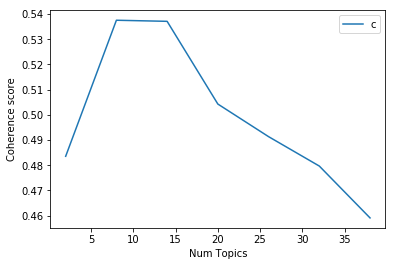

In [53]:
# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [54]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 2  has Coherence Value of 0.4836
Num Topics = 8  has Coherence Value of 0.5375
Num Topics = 14  has Coherence Value of 0.5371
Num Topics = 20  has Coherence Value of 0.5043
Num Topics = 26  has Coherence Value of 0.4913
Num Topics = 32  has Coherence Value of 0.4797
Num Topics = 38  has Coherence Value of 0.4591


**As highest value is with topic 8. So , it is best optimal size**

In [55]:
# Select the model and print the topics
optimal_model = model_list[1]
model_topics = optimal_model.show_topics(formatted=False)
pprint(optimal_model.print_topics(num_words=10))

[(0,
  '0.076*"cell" + 0.061*"fuel" + 0.017*"system" + 0.016*"stack" + '
  '0.015*"hydrogen" + 0.013*"include" + 0.011*"provide" + 0.010*"pile" + '
  '0.010*"electrode" + 0.010*"invention"'),
 (1,
  '0.022*"oil" + 0.019*"part" + 0.019*"body" + 0.017*"side" + 0.017*"end" + '
  '0.016*"utility" + 0.015*"model" + 0.014*"air" + 0.012*"provide" + '
  '0.011*"connect"'),
 (2,
  '0.048*"control" + 0.029*"torque" + 0.027*"speed" + 0.024*"value" + '
  '0.017*"start" + 0.016*"motor" + 0.014*"determine" + 0.013*"time" + '
  '0.013*"state" + 0.013*"travel"'),
 (3,
  '0.057*"power" + 0.052*"electric" + 0.048*"battery" + 0.046*"charge" + '
  '0.025*"control" + 0.022*"voltage" + 0.020*"system" + 0.018*"unit" + '
  '0.016*"device" + 0.015*"supply"'),
 (4,
  '0.070*"first" + 0.057*"second" + 0.047*"motor" + 0.039*"drive" + '
  '0.030*"hybrid" + 0.028*"clutch" + 0.026*"transmission" + 0.024*"mode" + '
  '0.023*"gear" + 0.022*"electric"'),
 (5,
  '0.042*"shaft" + 0.036*"gear" + 0.025*"motor" + 0.022*"dri

# 4)- Repeat same procedure for TF-IDF model as well

In [56]:
# Compute Perplexity:a measure of how good the model is. lower the better.
print('\nPerplexity: ', lda_model_tfidf.log_perplexity(corpus_tfidf)) 


Perplexity:  -7.9360612208124595


In [57]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model_tfidf, texts=data_ready, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.620478769842663


In [58]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus_tfidf, num_topics=num_topics, id2word=id2word)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [59]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus_tfidf, texts=data_ready, start=2, limit=40, step=6)

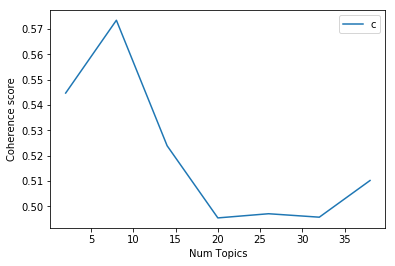

In [60]:
# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [61]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 2  has Coherence Value of 0.5447
Num Topics = 8  has Coherence Value of 0.5734
Num Topics = 14  has Coherence Value of 0.5239
Num Topics = 20  has Coherence Value of 0.4955
Num Topics = 26  has Coherence Value of 0.4971
Num Topics = 32  has Coherence Value of 0.4958
Num Topics = 38  has Coherence Value of 0.5102


In [62]:
# Select the model and print the topics. We choose 8 so, list[1].
optimal_model = model_list[1]
model_topics = optimal_model.show_topics(formatted=False)
pprint(optimal_model.print_topics(num_words=10))

[(0,
  '0.023*"cool" + 0.022*"air" + 0.019*"gas" + 0.016*"exhaust" + 0.016*"heat" + '
  '0.014*"water" + 0.011*"coolant" + 0.011*"flow" + 0.010*"temperature" + '
  '0.010*"pipe"'),
 (1,
  '0.018*"power" + 0.016*"battery" + 0.014*"electric" + 0.013*"gear" + '
  '0.013*"charge" + 0.012*"voltage" + 0.012*"motor" + 0.011*"shaft" + '
  '0.011*"first" + 0.010*"drive"'),
 (2,
  '0.032*"mg" + 0.023*"injection" + 0.017*"pressure" + 0.017*"fuel" + '
  '0.017*"valve" + 0.016*"cylinder" + 0.013*"combustion" + 0.013*"pump" + '
  '0.011*"oil" + 0.010*"compression"'),
 (3,
  '0.031*"cell" + 0.022*"fuel" + 0.021*"stack" + 0.016*"pile" + '
  '0.015*"hydrogen" + 0.011*"frame" + 0.011*"electrode" + 0.010*"tank" + '
  '0.008*"layer" + 0.008*"fill"'),
 (4,
  '0.016*"torque" + 0.013*"speed" + 0.012*"mode" + 0.011*"control" + '
  '0.010*"value" + 0.009*"hybrid" + 0.009*"start" + 0.009*"motor" + '
  '0.009*"travel" + 0.009*"clutch"'),
 (5,
  '0.012*"body" + 0.010*"side" + 0.009*"end" + 0.009*"part" + 0.008*"s

In [63]:
optimal_model.save('optimal_topic_model')

In [64]:
from gensim.models import LdaModel
optimal_model  = LdaModel.load('optimal_topic_model')

In [65]:
# use show_topic()
optimal_model.show_topics(num_topics=5)

[(3,
  '0.031*"cell" + 0.022*"fuel" + 0.021*"stack" + 0.016*"pile" + 0.015*"hydrogen" + 0.011*"frame" + 0.011*"electrode" + 0.010*"tank" + 0.008*"layer" + 0.008*"fill"'),
 (6,
  '0.027*"module" + 0.022*"charge" + 0.013*"information" + 0.012*"signal" + 0.010*"communication" + 0.010*"battery" + 0.009*"electric" + 0.008*"unit" + 0.008*"current" + 0.008*"bus"'),
 (0,
  '0.023*"cool" + 0.022*"air" + 0.019*"gas" + 0.016*"exhaust" + 0.016*"heat" + 0.014*"water" + 0.011*"coolant" + 0.011*"flow" + 0.010*"temperature" + 0.010*"pipe"'),
 (2,
  '0.032*"mg" + 0.023*"injection" + 0.017*"pressure" + 0.017*"fuel" + 0.017*"valve" + 0.016*"cylinder" + 0.013*"combustion" + 0.013*"pump" + 0.011*"oil" + 0.010*"compression"'),
 (5,
  '0.012*"body" + 0.010*"side" + 0.009*"end" + 0.009*"part" + 0.008*"support" + 0.008*"portion" + 0.008*"plate" + 0.007*"front" + 0.007*"member" + 0.007*"housing"')]

# 5)- Analysis of LDA model

The function get_term_topics returns the odds of a particular word belonging to some particular topic

In [66]:
optimal_model.get_term_topics('battery')

[(1, 0.016398292)]

The get_document_topics method returns topic distribution of the document along with topic distribution for each word in that document

In [67]:
print(data_ready[0])

['electrical', 'energy', 'system', 'include', 'electric', 'utility', 'electricity', 'generation', 'apparatus', 'distribution', 'plurality', 'electric', 'vehicle', 'electric', 'power', 'storage', 'apparatus', 'receive', 'electrical', 'power', 'electric', 'utility', 'supply', 'electrical', 'power', 'plurality', 'electric', 'vehicle', 'electric', 'utility', 'require', 'discharge', 'slurry', 'receive', 'discharge', 'slurry', 'storage', 'facility', 'electric', 'vehicle', 'storage', 'battery', 'supply', 'electrolytic', 'cell', 'suitable', 'pump', 'charge', 'slurry', 'receive', 'facility', 'store', 'storage', 'battery', 'supply', 'electric', 'vehicle', 'storage', 'battery', 'provide', 'necessary', 'economical', 'electrical', 'power', 'transmission', 'conversion', 'unit', 'synergistic', 'combination', 'disparate', 'activity', 'utility', 'energy', 'storage', 'electric', 'vehicle', 'operation', 'presently', 'uneconomical', 'provide', 'economical', 'electrical', 'utility', 'low', 'demand', 'stora

In [68]:
doc_number = 0
doc_topic, word_topic, phi_value = optimal_model.get_document_topics(corpus_tfidf[doc_number], per_word_topics=True)

In [69]:
doc_topic

[(0, 0.02019299),
 (1, 0.41661844),
 (2, 0.020194113),
 (3, 0.03968829),
 (4, 0.02025441),
 (5, 0.020181784),
 (6, 0.44269985),
 (7, 0.020170122)]

The output gives the topic distribution of the document

In [70]:
word_topic

[(0, [3]),
 (1, [1, 6]),
 (2, [1, 6]),
 (3, [1]),
 (4, [6, 1]),
 (5, [1]),
 (6, [1, 6]),
 (7, [6, 1]),
 (8, [1, 6]),
 (9, [1, 6]),
 (10, [1, 6]),
 (11, [1, 6]),
 (12, [1, 6]),
 (13, [1, 6]),
 (14, [6]),
 (15, [1, 6]),
 (16, [6]),
 (17, [1]),
 (18, [1]),
 (19, [1, 6]),
 (20, [1, 6]),
 (21, [6, 1]),
 (22, [6, 1]),
 (23, [6, 1]),
 (24, [1, 6]),
 (25, [6]),
 (26, [6, 1]),
 (27, [1, 6]),
 (28, [1, 6]),
 (29, [6, 1]),
 (30, [1, 6]),
 (31, [1]),
 (32, [6]),
 (33, [6]),
 (34, [1, 6]),
 (35, [6, 1]),
 (36, [6, 1]),
 (37, [1, 6]),
 (38, [6]),
 (39, [6, 1]),
 (40, [1]),
 (41, [6, 1]),
 (42, [1, 6])]

Output gives you word belonging to topics in given documents. In our case, its 1st row

In [71]:
phi_value

[(0, [(3, 0.11407495)]),
 (1, [(1, 0.05870986), (6, 0.04595517)]),
 (2, [(1, 0.061706956), (6, 0.038842686)]),
 (3, [(1, 0.038454883)]),
 (4, [(1, 0.012726841), (6, 0.023895526)]),
 (5, [(1, 0.08698726)]),
 (6, [(1, 0.06852806), (6, 0.015573473)]),
 (7, [(1, 0.06261545), (6, 0.09175439)]),
 (8, [(1, 0.07451005), (6, 0.03588246)]),
 (9, [(1, 0.06297179), (6, 0.016524456)]),
 (10, [(1, 0.13202685), (6, 0.109956965)]),
 (11, [(1, 0.1249346), (6, 0.08480886)]),
 (12, [(1, 0.20744279), (6, 0.07210726)]),
 (13, [(1, 0.050784096), (6, 0.02272941)]),
 (14, [(6, 0.13041748)]),
 (15, [(1, 0.062120043), (6, 0.031117488)]),
 (16, [(6, 0.2191896)]),
 (17, [(1, 0.057407442)]),
 (18, [(1, 0.030643234)]),
 (19, [(1, 0.011730999), (6, 0.010808703)]),
 (20, [(1, 0.061503246), (6, 0.018944314)]),
 (21, [(1, 0.03851653), (6, 0.05116125)]),
 (22, [(1, 0.014970282), (6, 0.021933485)]),
 (23, [(1, 0.039455604), (6, 0.07236729)]),
 (24, [(1, 0.08585128), (6, 0.026355894)]),
 (25, [(6, 0.15532531)]),
 (26, [(1

The output gives a ranked list of topics for every word. The lower the rank, more is the probability of the word belonging to that topic in the document.<br>
Phi values are essentially the probability of that word in that document belonging to a particular topic

### 5.1)-the Dominant topic and its percentage contribution in each document

In [72]:
def format_topics_sentences(ldamodel=None, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=corpus_tfidf, texts=data_ready)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,6.0,0.4424,"module, charge, information, signal, communica...","[electrical, energy, system, include, electric..."
1,1,1.0,0.8034,"power, battery, electric, gear, charge, voltag...","[electrical, energy, system, include, electric..."
2,2,3.0,0.3700,"cell, fuel, stack, pile, hydrogen, frame, elec...","[object, provide, particulate, trap, diesel, e..."
3,3,5.0,0.3819,"body, side, end, part, support, portion, plate...","[purpose, obtain, trap, leakage, exhaust, gas,..."
4,4,5.0,0.3338,"body, side, end, part, support, portion, plate...","[particulate, trap, diesel, engine, design, ef..."
5,5,3.0,0.3875,"cell, fuel, stack, pile, hydrogen, frame, elec...","[pct, pct_jp_sec_date, pub, mar, object, provi..."
6,6,5.0,0.5977,"body, side, end, part, support, portion, plate...","[mix, device, gas, fuel, air, internal, combus..."
7,7,5.0,0.5801,"body, side, end, part, support, portion, plate...","[mix, device, gas, fuel, air, internal, combus..."
8,8,5.0,0.6881,"body, side, end, part, support, portion, plate...","[area, mouth, injector, construct, flow, guide..."
9,9,2.0,0.6416,"mg, injection, pressure, fuel, valve, cylinder...","[internal, combustion, engine, least, injectio..."


In [73]:
df_dominant_topic.shape

(68762, 5)

In [74]:
df_dominant_topic.Dominant_Topic.value_counts()

4.0    20755
1.0    14480
5.0    10628
0.0     7649
6.0     6976
2.0     4158
3.0     4048
7.0       68
Name: Dominant_Topic, dtype: int64

In [75]:
import pickle
df_dominant_topic.to_pickle('top08_topic_dominant.pkl')

In [76]:
print(df_dominant_topic['Text'][2])

['object', 'provide', 'particulate', 'trap', 'diesel', 'engine', 'efficiently', 'burn', 'particulate', 'trap', 'filter', 'supply', 'oxygen', 'natural', 'convection', 'filter', 'regenerate', 'short', 'time', 'minimize', 'power', 'consume', 'heater', 'accomplish', 'purpose', 'end', 'plate', 'bracket', 'weld', 'compress', 'portion', 'inner', 'cylinder', 'outer', 'cylinder', 'heater', 'support', 'ceramic', 'insulator', 'mount', 'spaced', 'heater', 'ambient', 'air', 'introduce', 'passage', 'provide', 'extend', 'case', 'multiple', 'cylinder', 'filter', 'provide', 'case', 'image']


**Compare with original text i.e uncleaned**

'An object is to provide a particulate trap for a diesel engine which can efficiently burn particulates trapped by a filter while supplying oxygen by natural convection so that the filter can be regenerated in a short time while minimizing the power consumed by the heater. To accomplish this purpose, end plates 6, 7 and brackets 9 may be welded to compressed portions 4a, 5a of an inner cylinder 4 and an outer cylinder 5; heater-supporting ceramic insulators are mounted, spaced from each other, on a heater 14; and/or an ambient air introducing passage 36 is provided to extend from outside the case into a multiple-cylinder filter provided in the case.'

### 5.2)-Topic distribution across documents

In [78]:
# Number of Documents for Each Topic
topic_counts = df_topic_sents_keywords['Dominant_Topic'].value_counts()

# Percentage of Documents for Each Topic
topic_contribution = round(topic_counts/topic_counts.sum(), 8)

# Topic Number and Keywords
topic_num_keywords = df_topic_sents_keywords[['Dominant_Topic', 'Topic_Keywords']]

# Concatenate Column wise
df_dominant_topics = pd.concat([topic_num_keywords, topic_counts, topic_contribution], axis=1)

# Change Column names
df_dominant_topics.columns = ['Dominant_Topic', 'Topic_Keywords', 'Num_Documents', 'Perc_Documents']

# Show
df_dominant_topics.head(8)

,Dominant_Topic,Topic_Keywords,Num_Documents,Perc_Documents
0,6.0,"module, charge, information, signal, communica...",7649.0,0.111239
1,1.0,"power, battery, electric, gear, charge, voltag...",14480.0,0.210581
2,3.0,"cell, fuel, stack, pile, hydrogen, frame, elec...",4158.0,0.060469
3,5.0,"body, side, end, part, support, portion, plate...",4048.0,0.058870
4,5.0,"body, side, end, part, support, portion, plate...",20755.0,0.301838
5,3.0,"cell, fuel, stack, pile, hydrogen, frame, elec...",10628.0,0.154562
6,5.0,"body, side, end, part, support, portion, plate...",6976.0,0.101451
7,5.0,"body, side, end, part, support, portion, plate...",68.0,0.000989


### 5.2)-The most representative sentence for each topic

In [79]:
# Display setting to show more characters in column
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

# Show
sent_topics_sorteddf_mallet.head(8)

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0.0,0.8653,"cool, air, gas, exhaust, heat, water, coolant, flow, temperature, pipe","[system, regulate, operating, environment, electric, vehicle, battery, divide, battery, section,..."
1,1.0,0.8875,"power, battery, electric, gear, charge, voltage, motor, shaft, first, drive","[invention, drive, electric, vehicle, drive, shaft, compose, shaft, unit, assign, shaft, unit, c..."
2,2.0,0.8700,"mg, injection, pressure, fuel, valve, cylinder, combustion, pump, oil, compression","[problem, solve, provide, operate, method, device, combustion, engine, equip, internal, combusti..."
3,3.0,0.8624,"cell, fuel, stack, pile, hydrogen, frame, electrode, tank, layer, fill","[present, invention, relate, catalyst, removing, metal, carbonyl, comprise, nickel, contain, cat..."
4,4.0,0.8833,"torque, speed, mode, control, value, hybrid, start, motor, travel, clutch","[problem, solve, provide, hybrid, electric, vehicle, match, driver, expectation, optimize, effic..."
5,5.0,0.8841,"body, side, end, part, support, portion, plate, front, member, housing","[invention, relate, internal, combustion, engine, design, drive, transport, vehicle, different, ..."
6,6.0,0.8751,"module, charge, information, signal, communication, battery, electric, unit, current, bus","[method, device, trigger, hybrid, vehicle, describe, vehicle, drive, internal, combustion, engin..."
7,7.0,0.5029,"gear, planet, sun, carrier, ring, planetary, profile, fuse, tooth, chip","[utility, model, provide, method, hybrid, power, system, hybrid, vehicle, drive, system, include..."


In [80]:
print(sent_topics_sorteddf_mallet['Representative Text'][0])

['system', 'regulate', 'operating', 'environment', 'electric', 'vehicle', 'battery', 'divide', 'battery', 'section', 'installation', 'separate', 'housing', 'engine', 'compartment', 'boot', 'space', 'respectively', 'temperature', 'change', 'housing', 'cause', 'normal', 'battery', 'charge', 'discharge', 'cycle', 'service', 'control', 'predetermined', 'range', 'exclusion', 'explosive', 'gas', 'thereby', 'generate', 'fan', 'induce', 'air', 'circulation', 'connect', 'conduit', 'air', 'warm', 'heater', 'element', 'cool', 'external', 'air', 'temperature', 'fan', 'speed', 'sensor', 'control', 'appropriate', 'valve', 'housing']


**For our topic model analysis, stop here. We can do this for semantic analysis part.**

# 6)- Visualize

In [81]:
import nltk; nltk.download('stopwords')
# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\69785hsh\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [82]:
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

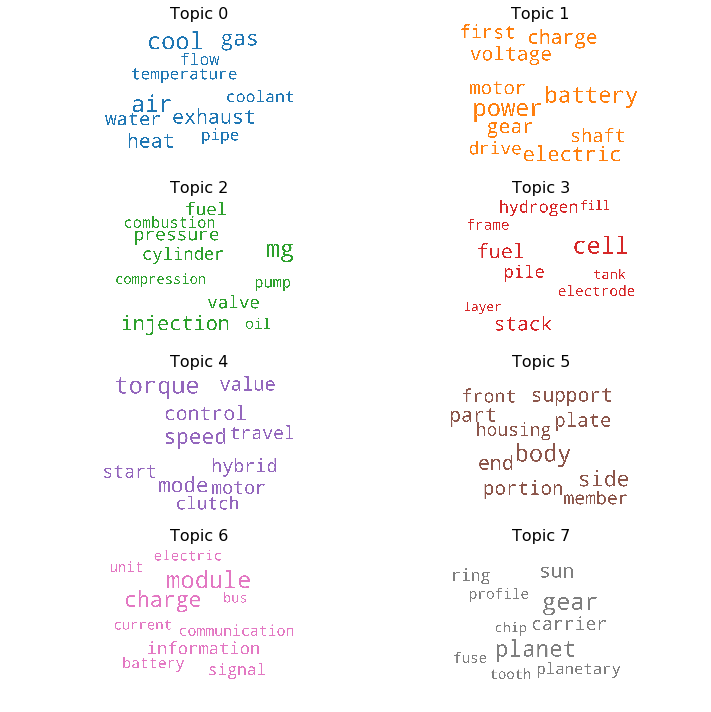

In [83]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = optimal_model.show_topics(formatted=False)

fig, axes = plt.subplots(4, 2, figsize=(10,10), sharex=True, sharey=True) # watch this value

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

### 6.1)- Bar-plot

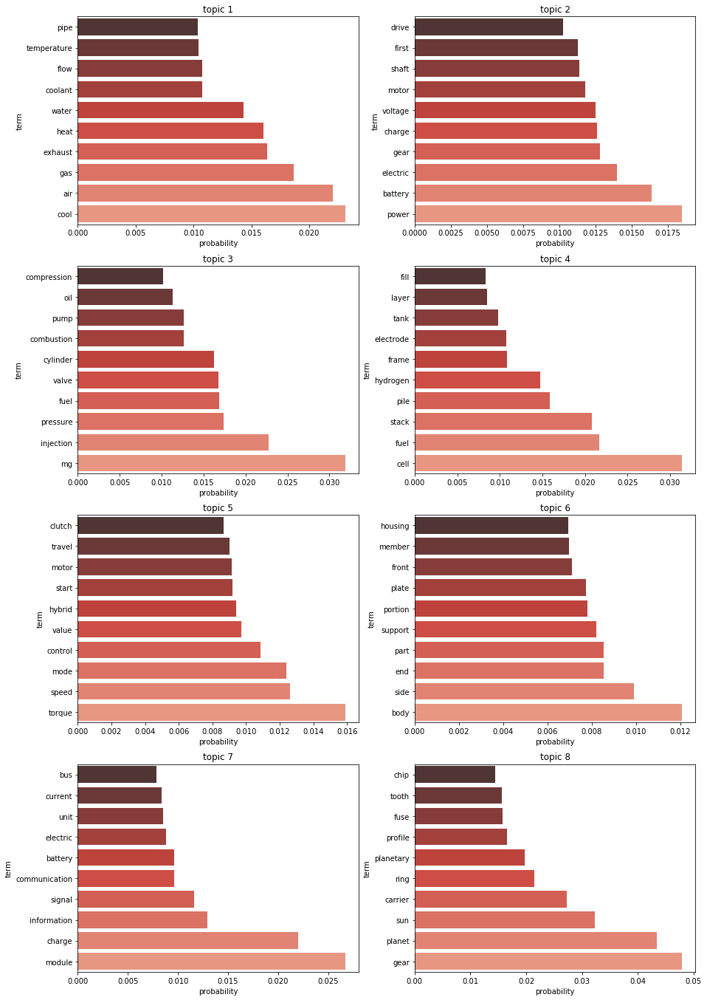

In [84]:
fiz=plt.figure(figsize=(15,30))
for i in range(8):
    df=pd.DataFrame(optimal_model.show_topic(i), columns=['term','prob']).set_index('term')
    df=df.sort_values('prob')
    
    plt.subplot(5,2,i+1)
    plt.title('topic '+str(i+1))
    sns.barplot(x='prob', y=df.index, data=df, label='patents', palette='Reds_d')
    plt.xlabel('probability')
    

plt.show()

In [85]:
import pyLDAvis
import pyLDAvis.gensim
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(optimal_model, corpus_tfidf, dictionary=optimal_model.id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.119823  0.171386       1        1  24.743038
1      0.085541  0.097289       2        1  18.463329
5      0.013808 -0.130360       3        1  14.149943
0      0.062079 -0.159892       4        1  11.302538
6      0.096795  0.160782       5        1  11.248154
2      0.065138 -0.003116       6        1   8.701756
3     -0.011709 -0.217290       7        1   7.942393
7     -0.431475  0.081201       8        1   3.448848, topic_info=     Category         Freq            Term        Total  loglift  logprob
term                                                                     
402   Default  1600.000000            gear  1600.000000  30.0000  30.0000
1889  Default   888.000000              mg   888.000000  29.0000  29.0000
3     Default  1566.000000            cell  1566.000000  28.0000  28.0000
386   Default  1247.000000          module  1247.000000  27.0000  27.0000
2274  Default   479.000000          planet   479.000000  26.0000  26.0000
467   Default   984.000000            cool   984.000000  25.0000  25.0000
168   Default  2010.000000            fuel  2010.000000  24.0000  24.0000
228   Default   794.000000       injection   794.000000  23.0000  23.0000
4     Default  2016.000000          charge  2016.000000  22.0000  22.0000
1295  Default   588.000000           stack   588.000000  21.0000  21.0000
45    Default  1206.000000             air  1206.000000  20.0000  20.0000
97    Default  1017.000000             gas  1017.000000  19.0000  19.0000
2150  Default   467.000000       planetary   467.000000  18.0000  18.0000
2326  Default   356.000000             sun   356.000000  17.0000  17.0000
867   Default   423.000000         carrier   423.000000  16.0000  16.0000
481   Default   768.000000           water   768.000000  15.0000  15.0000
815   Default  1502.000000          torque  1502.000000  14.0000  14.0000
284   Default   941.000000           valve   941.000000  13.0000  13.0000
95    Default   858.000000         exhaust   858.000000  12.0000  12.0000
190   Default   397.000000            ring   397.000000  11.0000  11.0000
98    Default   743.000000            heat   743.000000  10.0000  10.0000
3154  Default   404.000000            pile   404.000000   9.0000   9.0000
53    Default   870.000000        cylinder   870.000000   8.0000   8.0000
773   Default  1165.000000         voltage  1165.000000   7.0000   7.0000
1796  Default   629.000000     information   629.000000   6.0000   6.0000
979   Default   520.000000        hydrogen   520.000000   5.0000   5.0000
273   Default  1052.000000        pressure  1052.000000   4.0000   4.0000
24    Default  1995.000000           power  1995.000000   3.0000   3.0000
379   Default  1112.000000          clutch  1112.000000   2.0000   2.0000
370   Default  1015.000000             oil  1015.000000   1.0000   1.0000
...       ...          ...             ...          ...      ...      ...
2607   Topic8    68.883240        sprocket    69.888931   3.3526  -5.0764
2361   Topic8    64.682007      driveshaft    65.688156   3.3517  -5.1393
3004   Topic8    59.775490             nut    60.795727   3.3502  -5.2182
2729   Topic8    54.856262       substrate    55.861931   3.3490  -5.3041
2823   Topic8    53.044083             fin    54.053257   3.3483  -5.3377
1028   Topic8    88.987282       composite    90.693573   3.3481  -4.8203
1140   Topic8    52.331837        inertial    53.338207   3.3481  -5.3512
3354   Topic8    55.946743           print    57.028133   3.3480  -5.2844
1679   Topic8    51.107121         changer    52.113354   3.3476  -5.3749
2818   Topic8    50.961117       resonator    51.967705   3.3476  -5.3778
1520   Topic8    46.440071          govern    47.455509   3.3455  -5.4707
2936   Topic8    44.583660       deflector    45.599907   3.3446  -5.5115
1161   Topic8    43.199844         spindle    44.209408   3.3440  -5.5430
1676   Topic8

In [86]:
pyLDAvis.save_html(vis, 'pyLDAvis.html')

### 6.2) Heatmap

In [87]:
def plot_difference(mdiff, title="", annotation=None):
    """
    Helper function to plot difference between models
    """
    annotation_html = None
    if annotation is not None:
        annotation_html = [["+++ {}<br>--- {}".format(", ".join(int_tokens), ", ".join(diff_tokens))
                            for (int_tokens, diff_tokens) in row]
                           for row in annotation]
        
    data = Heatmap(z=mdiff, colorscale='RdBu', text=annotation_html)
    layout = Layout(width=950, height=950, title=title,
                       xaxis=dict(title="topic"), yaxis=dict(title="topic"))
    py.iplot(dict(data=[data], layout=layout))

In [88]:
difference_matrix, annotation = optimal_model.diff(optimal_model, distance='jensen_shannon', num_words=50)
plot_difference(difference_matrix, title="Topic difference [jensen shannon distance]", annotation=annotation)

### Topic network

In [89]:
# get topic distributions
topic_dist = optimal_model.state.get_lambda()

# get topic terms
num_words = 50
topic_terms = [{w for (w, _) in optimal_model.show_topic(topic, topn=num_words)} for topic in range(topic_dist.shape[0])]

In [90]:
from scipy.spatial.distance import pdist, squareform
from gensim.matutils import jensen_shannon
import networkx as nx
import itertools as itt

# calculate distance matrix using the input distance metric
def distance(X, dist_metric):
    return squareform(pdist(X, lambda u, v: dist_metric(u, v)))

topic_distance = distance(topic_dist, jensen_shannon)
topic_distance

array([[0.        , 0.49735528, 0.3843503 , 0.35645956, 0.51508451,
        0.38976544, 0.43222517, 0.80058849],
       [0.49735528, 0.        , 0.63396007, 0.63610709, 0.28463957,
        0.383564  , 0.35088688, 1.16633904],
       [0.3843503 , 0.63396007, 0.        , 0.43013945, 0.5227685 ,
        0.50758398, 0.45856214, 0.6684947 ],
       [0.35645956, 0.63610709, 0.43013945, 0.        , 0.64245927,
        0.46628618, 0.52094865, 0.68296379],
       [0.51508451, 0.28463957, 0.5227685 , 0.64245927, 0.        ,
        0.47636521, 0.325674  , 1.17311251],
       [0.38976544, 0.383564  , 0.50758398, 0.46628618, 0.47636521,
        0.        , 0.4381488 , 0.9430064 ],
       [0.43222517, 0.35088688, 0.45856214, 0.52094865, 0.325674  ,
        0.4381488 , 0.        , 0.92744523],
       [0.80058849, 1.16633904, 0.6684947 , 0.68296379, 1.17311251,
        0.9430064 , 0.92744523, 0.        ]])

In [91]:
import numpy as np

# store edges b/w every topic pair along with their distance
edges = [(i, j, {'weight': topic_distance[i, j]})
         for i, j in itt.combinations(range(topic_dist.shape[0]), 2)]

# keep edges with distance below the threshold value
k = np.percentile(np.array([e[2]['weight'] for e in edges]), 20)
edges = [e for e in edges if e[2]['weight'] < k]

In [92]:
# add nodes and edges to graph layout
G = nx.Graph()
G.add_nodes_from(range(topic_dist.shape[0]))
G.add_edges_from(edges)

pos = nx.spring_layout(G)

In [93]:
index = nx.betweenness_centrality(G)

In [94]:
node_size = [index[n]*10000 for n in G]

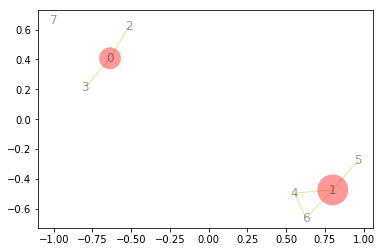

In [95]:
nx.draw_networkx(G, pos, node_size=node_size, edge_color='y', alpha=.4, linewidths=0)

### Dendogram

In [96]:
from scipy import spatial as scs
from scipy.cluster import hierarchy as sch
from scipy.spatial.distance import pdist, squareform
from gensim.matutils import jensen_shannon

# get topic distributions
topic_dist = optimal_model.state.get_lambda()

# get topic terms
num_words = 300
topic_terms = [{w for (w, _) in optimal_model.show_topic(topic, topn=num_words)} for topic in range(topic_dist.shape[0])]

# no. of terms to display in annotation
n_ann_terms = 8

# use Jensen-Shannon distance metric in dendrogram
def js_dist(X):
    return pdist(X, lambda u, v: jensen_shannon(u, v))

# define method for distance calculation in clusters
linkagefun=lambda x: sch.linkage(x, 'single')

# calculate text annotations
def text_annotation(topic_dist, topic_terms, n_ann_terms, linkagefun):
    # get dendrogram hierarchy data
    linkagefun = lambda x: sch.linkage(x, 'single')
    d = js_dist(topic_dist)
    Z = linkagefun(d)
    P = sch.dendrogram(Z, orientation="bottom", no_plot=True)

    # store topic no.(leaves) corresponding to the x-ticks in dendrogram
    x_ticks = np.arange(5, len(P['leaves']) * 10 + 5, 10)
    x_topic = dict(zip(P['leaves'], x_ticks))

    # store {topic no.:topic terms}
    topic_vals = dict()
    for key, val in x_topic.items():
        topic_vals[val] = (topic_terms[key], topic_terms[key])

    text_annotations = []
    # loop through every trace (scatter plot) in dendrogram
    for trace in P['icoord']:
        fst_topic = topic_vals[trace[0]]
        scnd_topic = topic_vals[trace[2]]
        
        # annotation for two ends of current trace
        pos_tokens_t1 = list(fst_topic[0])[:min(len(fst_topic[0]), n_ann_terms)]
        neg_tokens_t1 = list(fst_topic[1])[:min(len(fst_topic[1]), n_ann_terms)]

        pos_tokens_t4 = list(scnd_topic[0])[:min(len(scnd_topic[0]), n_ann_terms)]
        neg_tokens_t4 = list(scnd_topic[1])[:min(len(scnd_topic[1]), n_ann_terms)]

        t1 = "<br>".join((": ".join(("+++", str(pos_tokens_t1))), ": ".join(("---", str(neg_tokens_t1)))))
        t2 = t3 = ()
        t4 = "<br>".join((": ".join(("+++", str(pos_tokens_t4))), ": ".join(("---", str(neg_tokens_t4)))))

        # show topic terms in leaves
        if trace[0] in x_ticks:
            t1 = str(list(topic_vals[trace[0]][0])[:n_ann_terms])
        if trace[2] in x_ticks:
            t4 = str(list(topic_vals[trace[2]][0])[:n_ann_terms])

        text_annotations.append([t1, t2, t3, t4])

        # calculate intersecting/diff for upper level
        intersecting = fst_topic[0] & scnd_topic[0]
        different = fst_topic[0].symmetric_difference(scnd_topic[0])

        center = (trace[0] + trace[2]) / 2
        topic_vals[center] = (intersecting, different)

        # remove trace value after it is annotated
        topic_vals.pop(trace[0], None)
        topic_vals.pop(trace[2], None)  
        
    return text_annotations

# get text annotations
annotation = text_annotation(topic_dist, topic_terms, n_ann_terms, linkagefun)

# Plot dendrogram
dendro = ff.create_dendrogram(topic_dist, distfun=js_dist, labels=range(0, 8), linkagefun=linkagefun, hovertext=annotation)
dendro['layout'].update({'width': 1000, 'height': 600})
py.iplot(dendro)

### t-SNE

Refactoring results of LDA into numpy matrix (number_of_patents x number_of_topics).

In [97]:
hm = np.array([[y for (x,y) in optimal_model[corpus_tfidf[i]]] for i in range(len(corpus_tfidf))])

In [98]:
from sklearn.manifold import TSNE
tsne = TSNE(random_state=2018, perplexity=30)
embedding = tsne.fit_transform(hm)
embedding = pd.DataFrame(embedding, columns=['x','y'])
embedding['hue'] = hm.argmax(axis=1)

In [102]:
source = ColumnDataSource(
        data=dict(
            x = embedding.x,
            y = embedding.y,
            colors = [all_palettes['Set1'][8][i] for i in embedding.hue],
            title = patent.appln_title,
            year = year,
            alpha = [0.9] * embedding.shape[0],
            size = [7] * embedding.shape[0]
        )
    )
hover_tsne = HoverTool(names=["df"], tooltips="""
    <div style="margin: 10">
        <div style="margin: 0 auto; width:300px;">
            <span style="font-size: 12px; font-weight: bold;">Title:</span>
            <span style="font-size: 12px">@title</span>
            <span style="font-size: 12px; font-weight: bold;">Year:</span>
            <span style="font-size: 12px">@year</span>
        </div>
    </div>
    """)
tools_tsne = [hover_tsne, 'pan', 'wheel_zoom', 'reset']
plot_tsne = figure(plot_width=700, plot_height=700, tools=tools_tsne, title='Papers')
plot_tsne.circle('x', 'y', size='size', fill_color='colors', 
                 alpha='alpha', line_alpha=0, line_width=0.01, source=source, name="df")

callback = CustomJS(args=dict(source=source), code="""
    var data = source.data;
    var f = cb_obj.value
    x = data['x']
    y = data['y']
    colors = data['colors']
    alpha = data['alpha']
    title = data['title']
    year = data['year']
    size = data['size']
    for (i = 0; i < x.length; i++) {
        if (year[i] <= f) {
            alpha[i] = 0.9
            size[i] = 7
        } else {
            alpha[i] = 0.05
            size[i] = 4
        }
    }
    source.trigger('change');
""")

slider = Slider(start=year.min(), end=year.max(), value=2018, step=1, title="Before year")
slider.js_on_change('value', callback)

layout = column(slider, plot_tsne)

In [103]:
show(layout)